In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import pandas as pd
import sys 

import plotly.express as px

In [58]:
pd.set_option('display.max_columns', 200)
pd.set_option('display.max_rows', 100)
pd.set_option('display.min_rows', 100)

In [3]:
sys.path.append("../")

In [4]:
from utils.config import PLANT_1_DATA_PATH, PLANT_2_DATA_PATH

In [27]:
from utils.utils import transform_pv_plant, summarize_inverter_production, plot_boxplots, plot_inverter_production_curve

In [60]:
plant_one_df = pd.read_csv(PLANT_1_DATA_PATH)
plant_two_df = pd.read_csv(PLANT_2_DATA_PATH)

In [8]:
plant_two_df.head()

,DATE_TIME,PLANT_ID,SOURCE_KEY,DC_POWER,AC_POWER,DAILY_YIELD,TOTAL_YIELD
0,2020-05-15 00:00:00,4136001,4UPUqMRk7TRMgml,0.0,0.0,9425.000000,2.429011e+06
1,2020-05-15 00:00:00,4136001,81aHJ1q11NBPMrL,0.0,0.0,0.000000,1.215279e+09
2,2020-05-15 00:00:00,4136001,9kRcWv60rDACzjR,0.0,0.0,3075.333333,2.247720e+09
3,2020-05-15 00:00:00,4136001,Et9kgGMDl729KT4,0.0,0.0,269.933333,1.704250e+06
4,2020-05-15 00:00:00,4136001,IQ2d7wF4YD8zU1Q,0.0,0.0,3177.000000,1.994153e+07


In [9]:
plant_one_df = transform_pv_plant(plant_one_df, date_format="%d-%m-%Y %H:%M")

In [10]:
plant_two_df = transform_pv_plant(plant_two_df, date_format="%Y-%m-%d %H:%M:%S")

In [11]:
plant_one_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 68778 entries, 0 to 68777
Data columns (total 10 columns):
 #   Column       Non-Null Count  Dtype   
---  ------       --------------  -----   
 0   date_time    68778 non-null  object  
 1   plant_id     68778 non-null  int64   
 2   ac_power     68778 non-null  float64 
 3   year         68778 non-null  int64   
 4   month        68778 non-null  int64   
 5   day          68778 non-null  int64   
 6   hour         68778 non-null  int64   
 7   min          68778 non-null  int64   
 8   day_of_year  68778 non-null  int64   
 9   inverter     68778 non-null  category
dtypes: category(1), float64(1), int64(7), object(1)
memory usage: 4.8+ MB


In [12]:
plant_two_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 67698 entries, 0 to 67697
Data columns (total 10 columns):
 #   Column       Non-Null Count  Dtype   
---  ------       --------------  -----   
 0   date_time    67698 non-null  object  
 1   plant_id     67698 non-null  int64   
 2   ac_power     67698 non-null  float64 
 3   year         67698 non-null  int64   
 4   month        67698 non-null  int64   
 5   day          67698 non-null  int64   
 6   hour         67698 non-null  int64   
 7   min          67698 non-null  int64   
 8   day_of_year  67698 non-null  int64   
 9   inverter     67698 non-null  category
dtypes: category(1), float64(1), int64(7), object(1)
memory usage: 4.7+ MB


In [13]:
summarize_inverter_production(plant_one_df)

inverter         date_time                         ac_power  \
                              min               max count      min   
0    inverter_0  2020-05-15 00:00  2020-06-17 23:45  3154      0.0   
1    inverter_1  2020-05-15 00:00  2020-06-17 23:45  3119      0.0   
2    inverter_2  2020-05-15 00:00  2020-06-17 23:45  3118      0.0   
3    inverter_3  2020-05-15 00:00  2020-06-17 23:45  3133      0.0   
4    inverter_4  2020-05-15 00:00  2020-06-17 23:45  3124      0.0   
5    inverter_5  2020-05-15 00:00  2020-06-17 23:45  3133      0.0   
6    inverter_6  2020-05-15 00:00  2020-06-17 23:45  3118      0.0   
7   inverter_21  2020-05-15 01:00  2020-06-17 23:45  3104      0.0   
8    inverter_7  2020-05-15 00:00  2020-06-17 23:45  3130      0.0   
9    inverter_8  2020-05-15 00:00  2020-06-17 23:45  3123      0.0   
10   inverter_9  2020-05-15 00:00  2020-06-17 23:45  3119      0.0   
11  inverter_10  2020-05-15 00:00  2020-06-17 23:45  3155      0.0   
12  inverter_11  2020-05-15 00:00  2020-06-17 23:45  3125      0.0   
13  inverter_12  2020-05-15 00:00  2020-06-17 23:45  3130      0.0   
14  inverter_13  2020-05-15 00:00  2020-06-17 23:45  3125      0.0   
15  inverter_14  2020-05-15 00:00  2020-06-17 23:45  3124      0.0   
16  inverter_15  2020-05-15 00:00  2020-06-17 23:45  3124      0.0   
17  inverter_16  2020-05-15 00:00  2020-06-17 23:45  3125      0.0   
18  inverter_17  2020-05-15 00:00  2020-06-17 23:45  3126      0.0   
19  inverter_18  2020-05-15 00:00  2020-06-17 23:45  3126      0.0   
20  inverter_19  2020-05-15 00:00  2020-06-17 23:45  3119      0.0   
21  inverter_20  2020-05-15 00:00  2020-06-17 23:45  3124      0.0   

                                                                             
   _quantile25 _quantile50 _quantile75          max        mean         std  
0          0.0   29.261607  565.209375  1300.171429  281.124073  367.646871  
1          0.0   43.687500  636.156250  1394.514286  315.488026  402.301747  
2          0.0   44.123214  636.950000  1399.225000  314.967354  402.373790  
3          0.0   42.428571  618.071429  1384.871429  306.385671  392.300240  
4          0.0   42.502679  637.363393  1405.800000  314.046321  402.278537  
5          0.0   43.214286  632.985714  1394.214286  313.900096  402.009046  
6          0.0   43.457143  621.868750  1376.350000  308.575465  393.673488  
7          0.0   46.478571  627.843750  1410.528571  310.930334  395.711539  
8          0.0   42.379464  632.875000  1391.642857  312.346427  399.791497  
9          0.0   43.600000  626.041071  1395.485714  306.980623  391.891363  
10         0.0   45.400000  640.792857  1405.585714  319.693862  407.920560  
11         0.0   27.514286  559.431250  1265.157143  276.778938  361.579929  
12         0.0   42.742857  639.057143  1407.542857  312.540320  399.354809  
13         0.0   41.450000  613.096875  1377.314286  302.962438  388.040381  
14         0.0   42.528571  629.062500  1379.625000  309.670213  394.942694  
15         0.0   43.106250  628.387500  1392.842857  309.345658  394.750370  
16         0.0   41.750000  625.255804  1399.842857  307.912265  393.687601  
17         0.0   43.385714  637.533333  1377.250000  312.467844  398.359247  
18         0.0   41.916071  629.838393  1410.950000  310.064044  398.780301  
19         0.0   40.021429  622.317857  1401.125000  306.492026  393.570990  
20         0.0   42.685714  626.485714  1393.242857  307.925344  393.246025  
21         0.0   42.550000  633.603571  1397.085714  311.676665  398.685362

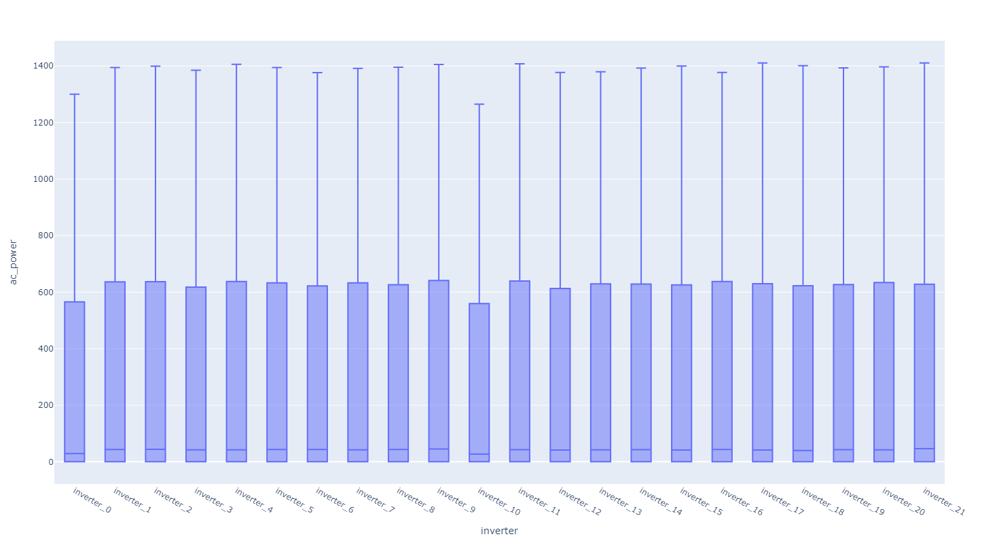

In [21]:
plot_boxplots(plant_one_df)

In [15]:
summarize_inverter_production(plant_two_df)

inverter         date_time                         ac_power  \
                              min               max count      min   
0    inverter_0  2020-05-15 00:00  2020-06-17 23:45  3195      0.0   
1    inverter_1  2020-05-15 00:00  2020-06-17 23:45  3259      0.0   
2    inverter_2  2020-05-15 00:00  2020-06-17 23:45  3259      0.0   
3    inverter_3  2020-05-15 00:00  2020-06-17 23:45  3195      0.0   
4    inverter_4  2020-05-15 00:00  2020-06-17 23:45  2355      0.0   
5    inverter_5  2020-05-15 00:00  2020-06-17 23:45  3259      0.0   
6    inverter_6  2020-05-15 00:00  2020-06-17 23:45  3259      0.0   
7    inverter_7  2020-05-15 00:00  2020-06-17 23:45  3195      0.0   
8    inverter_8  2020-05-15 00:00  2020-06-17 23:45  2355      0.0   
9    inverter_9  2020-05-15 00:00  2020-06-17 23:45  3259      0.0   
10  inverter_10  2020-05-15 00:00  2020-06-17 23:45  3195      0.0   
11  inverter_11  2020-05-15 00:00  2020-06-17 23:45  3195      0.0   
12  inverter_12  2020-05-15 00:00  2020-06-17 23:45  3259      0.0   
13  inverter_13  2020-05-15 00:00  2020-06-17 23:45  3259      0.0   
14  inverter_14  2020-05-15 00:00  2020-06-17 23:45  2355      0.0   
15  inverter_15  2020-05-15 00:00  2020-06-17 23:45  3195      0.0   
16  inverter_16  2020-05-15 00:00  2020-06-17 23:45  3259      0.0   
17  inverter_17  2020-05-15 00:00  2020-06-17 23:45  3259      0.0   
18  inverter_18  2020-05-15 00:00  2020-06-17 23:45  3259      0.0   
19  inverter_19  2020-05-15 00:00  2020-06-17 23:45  3259      0.0   
20  inverter_20  2020-05-15 00:00  2020-06-17 23:45  2355      0.0   
21  inverter_21  2020-05-15 00:00  2020-06-17 23:45  3259      0.0   

                                                                             
   _quantile25 _quantile50 _quantile75          max        mean         std  
0          0.0    0.000000  496.310000  1384.346667  271.576886  392.284959  
1          0.0    0.000000  404.096667  1347.660000  225.728343  352.191153  
2          0.0    0.000000  440.860714  1361.666667  239.281783  361.384153  
3          0.0    0.000000  295.610000  1172.653333  184.230269  299.638506  
4          0.0   14.633333  511.960000  1383.457143  279.190055  388.267326  
5          0.0    0.000000  322.213333  1265.666667  192.090443  309.319904  
6          0.0    0.000000  442.542381  1338.346667  240.110947  360.900449  
7          0.0    0.000000  517.635714  1377.153333  278.659553  396.937829  
8          0.0    8.871429  491.510000  1370.957143  267.485098  375.913398  
9          0.0    0.000000  445.326667  1347.526667  243.223341  362.711619  
10         0.0    0.000000  496.926667  1369.393333  272.536981  393.503737  
11         0.0    0.000000  285.540476  1205.706667  169.644735  269.517028  
12         0.0    0.000000  474.686667  1333.066667  256.349690  380.071741  
13         0.0    0.000000  433.152143  1363.513333  239.830791  367.224445  
14         0.0   12.586667  492.040000  1372.020000  269.615561  376.096833  
15         0.0    0.000000  499.006667  1385.420000  270.871922  392.529440  
16         0.0    0.000000  464.420000  1371.280000  250.272445  371.871202  
17         0.0    0.000000  395.973333  1325.833333  221.252177  340.959752  
18         0.0    0.000000  349.926667  1378.766667  204.664730  322.299061  
19         0.0    0.000000  473.950000  1294.300000  256.217292  377.408735  
20         0.0   14.800000  505.550000  1373.653333  274.504768  381.644934  
21         0.0    0.000000  424.209762  1371.013333  235.634459  355.299743

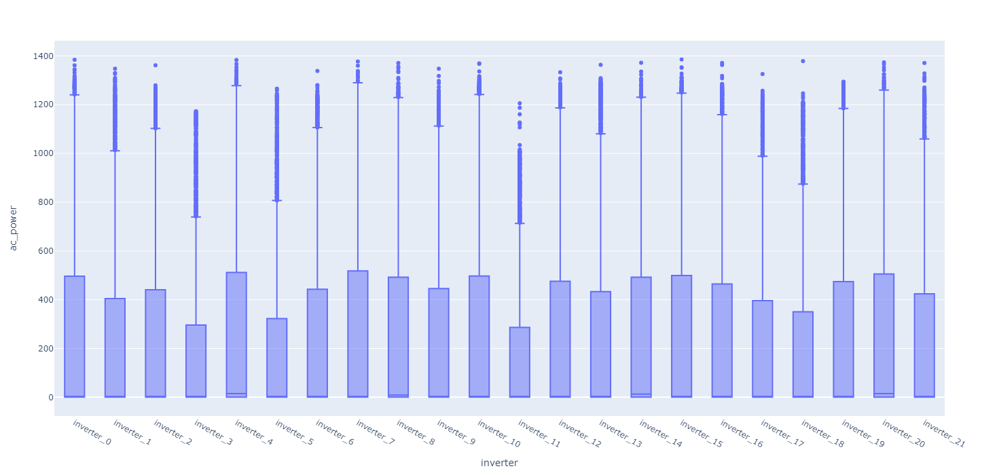

In [26]:
plot_boxplots(plant_two_df)

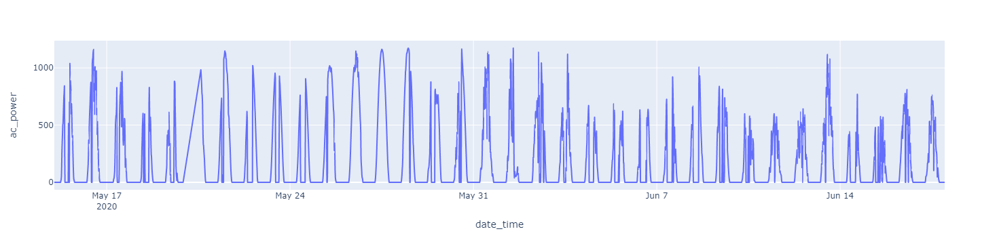

In [40]:
plot_inverter_production_curve(plant_two_df, "inverter_3")

In [ ]:
plant_two_df[plant_two_df['inverter']].

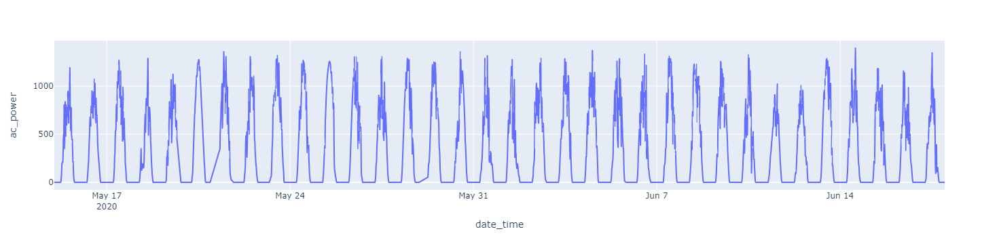

In [32]:
plot_inverter_production_curve(plant_one_df, "inverter_1")

In [36]:
plants_df = pd.concat([plant_one_df, plant_two_df])

In [43]:
plants_df['inverter_production_of_day'] = plants_df['inverter'].astype(str) + "_day_" + plants_df['day_of_year'].astype(str)

In [45]:
plants_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 136476 entries, 0 to 67697
Data columns (total 11 columns):
 #   Column                      Non-Null Count   Dtype   
---  ------                      --------------   -----   
 0   date_time                   136476 non-null  object  
 1   plant_id                    136476 non-null  int64   
 2   ac_power                    136476 non-null  float64 
 3   year                        136476 non-null  int64   
 4   month                       136476 non-null  int64   
 5   day                         136476 non-null  int64   
 6   hour                        136476 non-null  int64   
 7   min                         136476 non-null  int64   
 8   day_of_year                 136476 non-null  int64   
 9   inverter                    136476 non-null  category
 10  inverter_production_of_day  136476 non-null  object  
dtypes: category(1), float64(1), int64(7), object(2)
memory usage: 11.6+ MB


In [59]:
plants_df.loc[plants_df['plant_id']==4135001, ['hour', "min", "plant_id", "inverter_production_of_day", "ac_power"]].pivot(index=["hour", "min","plant_id"], columns=["inverter_production_of_day"], values="ac_power").reset_index()

inverter_production_of_day,hour,min,plant_id,inverter_0_day_136,inverter_0_day_137,inverter_0_day_138,inverter_0_day_139,inverter_0_day_140,inverter_0_day_141,inverter_0_day_142,inverter_0_day_143,inverter_0_day_144,inverter_0_day_145,inverter_0_day_146,inverter_0_day_147,inverter_0_day_148,inverter_0_day_149,inverter_0_day_150,inverter_0_day_151,inverter_0_day_152,inverter_0_day_153,inverter_0_day_154,inverter_0_day_155,inverter_0_day_156,inverter_0_day_157,inverter_0_day_158,inverter_0_day_159,inverter_0_day_160,inverter_0_day_161,inverter_0_day_162,inverter_0_day_163,inverter_0_day_164,inverter_0_day_165,inverter_0_day_166,inverter_0_day_167,inverter_0_day_168,inverter_0_day_169,inverter_10_day_136,inverter_10_day_137,inverter_10_day_138,inverter_10_day_139,inverter_10_day_140,inverter_10_day_141,inverter_10_day_142,inverter_10_day_143,inverter_10_day_144,inverter_10_day_145,inverter_10_day_146,inverter_10_day_147,inverter_10_day_148,inverter_10_day_149,inverter_10_day_150,inverter_10_day_151,inverter_10_day_152,inverter_10_day_153,inverter_10_day_154,inverter_10_day_155,inverter_10_day_156,inverter_10_day_157,inverter_10_day_158,inverter_10_day_159,inverter_10_day_160,inverter_10_day_161,inverter_10_day_162,inverter_10_day_163,inverter_10_day_164,inverter_10_day_165,inverter_10_day_166,inverter_10_day_167,inverter_10_day_168,inverter_10_day_169,inverter_11_day_136,inverter_11_day_137,inverter_11_day_138,inverter_11_day_139,inverter_11_day_140,inverter_11_day_141,inverter_11_day_142,inverter_11_day_143,inverter_11_day_144,inverter_11_day_145,inverter_11_day_146,inverter_11_day_147,inverter_11_day_148,inverter_11_day_149,inverter_11_day_150,inverter_11_day_151,inverter_11_day_152,inverter_11_day_153,inverter_11_day_154,inverter_11_day_155,inverter_11_day_156,inverter_11_day_157,inverter_11_day_158,inverter_11_day_159,inverter_11_day_160,inverter_11_day_161,inverter_11_day_162,inverter_11_day_163,inverter_11_day_164,...,inverter_7_day_138,inverter_7_day_139,inverter_7_day_140,inverter_7_day_141,inverter_7_day_142,inverter_7_day_143,inverter_7_day_144,inverter_7_day_145,inverter_7_day_146,inverter_7_day_147,inverter_7_day_148,inverter_7_day_149,inverter_7_day_150,inverter_7_day_151,inverter_7_day_152,inverter_7_day_153,inverter_7_day_154,inverter_7_day_155,inverter_7_day_156,inverter_7_day_157,inverter_7_day_158,inverter_7_day_159,inverter_7_day_160,inverter_7_day_161,inverter_7_day_162,inverter_7_day_163,inverter_7_day_164,inverter_7_day_165,inverter_7_day_166,inverter_7_day_167,inverter_7_day_168,inverter_7_day_169,inverter_8_day_136,inverter_8_day_137,inverter_8_day_138,inverter_8_day_139,inverter_8_day_140,inverter_8_day_141,inverter_8_day_142,inverter_8_day_143,inverter_8_day_144,inverter_8_day_145,inverter_8_day_146,inverter_8_day_147,inverter_8_day_148,inverter_8_day_149,inverter_8_day_150,inverter_8_day_151,inverter_8_day_152,inverter_8_day_153,inverter_8_day_154,inverter_8_day_155,inverter_8_day_156,inverter_8_day_157,inverter_8_day_158,inverter_8_day_159,inverter_8_day_160,inverter_8_day_161,inverter_8_day_162,inverter_8_day_163,inverter_8_day_164,inverter_8_day_165,inverter_8_day_166,inverter_8_day_167,inverter_8_day_168,inverter_8_day_169,inverter_9_day_136,inverter_9_day_137,inverter_9_day_138,inverter_9_day_139,inverter_9_day_140,inverter_9_day_141,inverter_9_day_142,inverter_9_day_143,inverter_9_day_144,inverter_9_day_145,inverter_9_day_146,inverter_9_day_147,inverter_9_day_148,inverter_9_day_149,inverter_9_day_150,inverter_9_day_151,inverter_9_day_152,inverter_9_day_153,inverter_9_day_154,inverter_9_day_155,inverter_9_day_156,inverter_9_day_157,inverter_9_day_158,inverter_9_day_159,inverter_9_day_160,inverter_9_day_161,inverter_9_day_162,inverter_9_day_163,inverter_9_day_164,inverter_9_day_165,inverter_9_day_166,inverter_9_day_167,inverter_9_day_168,inverter_9_day_169
0,0,0,4135001,0.000000,NaN,0.000000,0.000000,0.000000,0.000000,NaN,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,NaN,0.000000,0.

In [53]:
15  * 4 * 24 

1440